# BI Project - Breast Cancer

## **Content of the Notebook**

Procedure according to CRISP-DM Framework.

The steps Data Understanding to Evaluation are illustrated in the notebook, all other contents are dealt with in the written elaboration.

- Business Understanding
- **Data Understanding**
- **Data Preperation**
- **Modeling**
- **Evaluation**
- Deployment Options & Future Outlook
- Conclusion



*The content and structure of the notebook, as well as definitions and explanations, are strongly based on the “Applied Analytics” course*

In [28]:
# Read csv file
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score

df = pd.read_csv("data.csv")
    

## 1. Data Understanding

**Task:**
- Describe the dataset used
- Explore and describe features
- Discuss data quality (e.g., missing values)
- Highlight patterns or trends
- Include visualizations to support your data understanding


### Descriptive Statistics

Data Structure:

- 1 Table
- CSV-Format 
- Each feature has 2 linked/related features (except for the target variable and the ID) - e.g. the Radius variable has 3 columns: Mean, Standard Erros and Worst Radius



Data Content:
- Number of observations & variables
- Data types

In [29]:
# Create Overview
print("\nOverall Dataset Metrics:")
print(f"Total Entries: {len(df)}")
print(f"Total Features: {df.shape[1]}")
print(f"Features: {[col for col in df.columns]}")

# Remove "unnamed" column
df = df.drop(columns=[col for col in df.columns if "Unnamed" in col])
print(f"Features: {[col for col in df.columns]}")


Overall Dataset Metrics:
Total Entries: 569
Total Features: 33
Features: ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32']
Features: ['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symm

Numerical/contiuos variables
- Distribution
- Min, Max, Mean, Median
- Standard Deviation
- Skewness
- Kurtosis


Descriptive Statistics:
                             Min       Max     Mean   Median  Std Dev  \
radius_mean                6.981    28.110   14.127   13.370    3.524   
texture_mean               9.710    39.280   19.290   18.840    4.301   
perimeter_mean            43.790   188.500   91.969   86.240   24.299   
area_mean                143.500  2501.000  654.889  551.100  351.914   
smoothness_mean            0.053     0.163    0.096    0.096    0.014   
compactness_mean           0.019     0.345    0.104    0.093    0.053   
concavity_mean             0.000     0.427    0.089    0.062    0.080   
concave points_mean        0.000     0.201    0.049    0.034    0.039   
symmetry_mean              0.106     0.304    0.181    0.179    0.027   
fractal_dimension_mean     0.050     0.097    0.063    0.062    0.007   
radius_se                  0.112     2.873    0.405    0.324    0.277   
texture_se                 0.360     4.885    1.217    1.108    0.552   
perimeter_se               

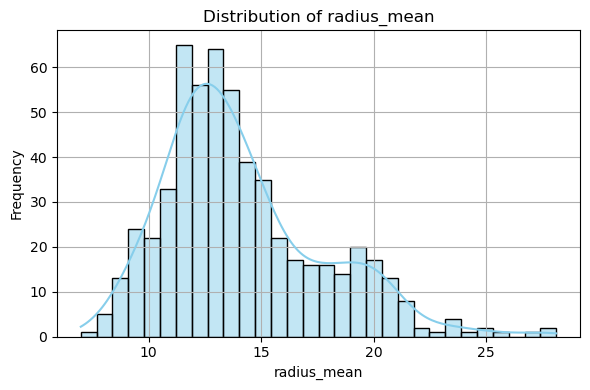

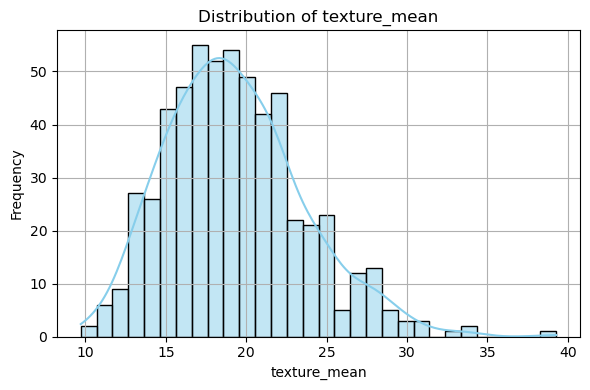

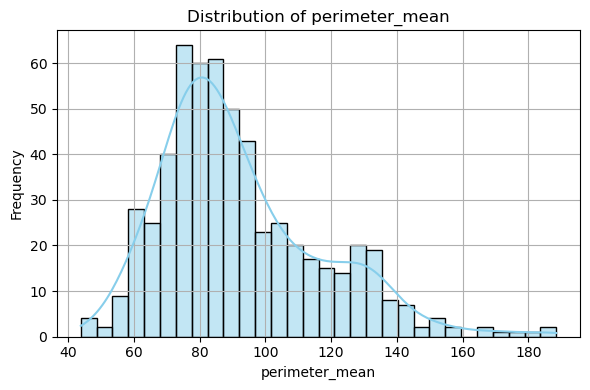

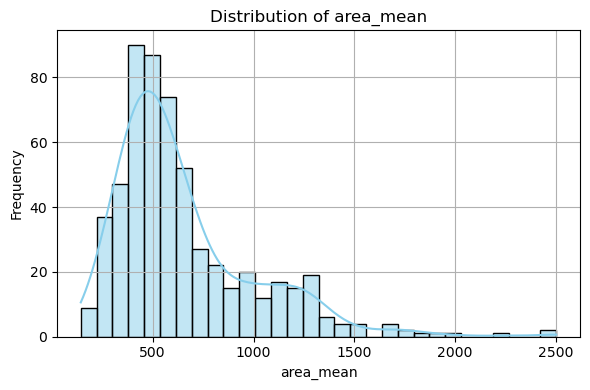

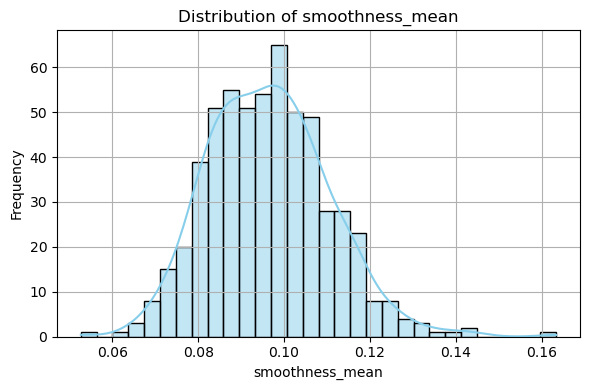

...

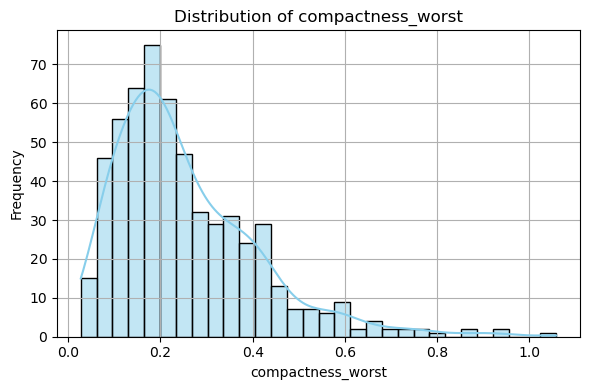

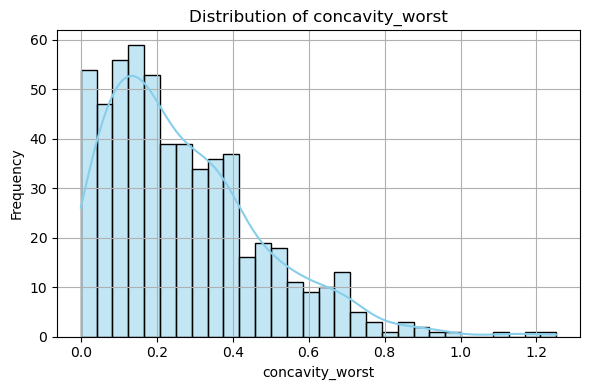

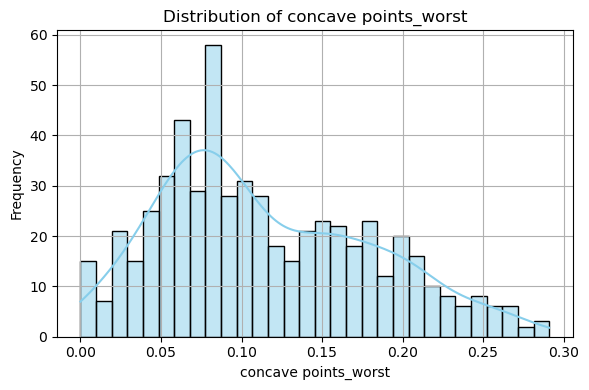

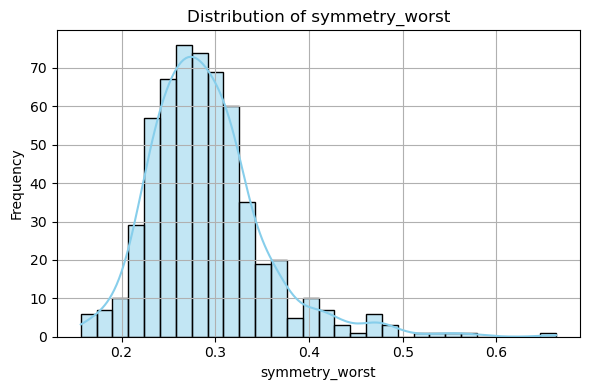

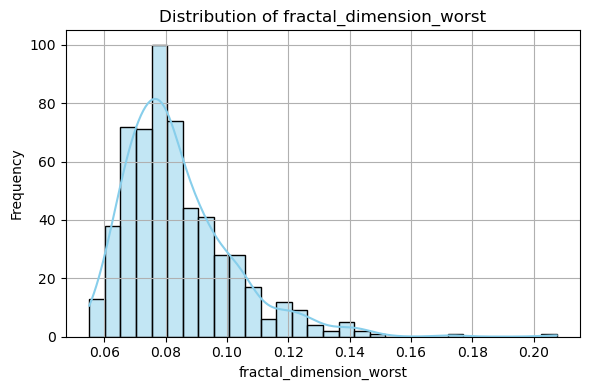

In [30]:
# Describe numerical data
# Filter numerical/continuous columns
df = df.drop(columns=df.columns[0])
numeric_cols = df.select_dtypes(include=['number'])
# Descriptive statistics
desc_stats = pd.DataFrame({
    'Min': numeric_cols.min(),
    'Max': numeric_cols.max(),
    'Mean': numeric_cols.mean(),
    'Median': numeric_cols.median(),
    'Std Dev': numeric_cols.std(),
    'Skewness': numeric_cols.skew(),
    'Kurtosis': numeric_cols.kurt()
})

print("Descriptive Statistics:")
print(desc_stats.round(3))  # Round for cleaner display

# Plot distributions
for col in numeric_cols.columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Visualization
- Plot data (Unidimensional (Histograms) and Multidemensional(Scatterplots))

In [31]:
# Visualization
# - Plot data (Unidimensional (Histograms) and Multidemensional(Scatterplots)
sns.pairplot(df, corner=True)  # corner=True hides duplicate upper plots
plt.show()

Highly correlated feature pairs (|r| > 0.8):
[('perimeter_mean', 'radius_mean'), ('area_mean', 'radius_mean'), ('area_mean', 'perimeter_mean'), ('concavity_mean', 'compactness_mean'), ('concave points_mean', 'radius_mean'), ('concave points_mean', 'perimeter_mean'), ('concave points_mean', 'area_mean'), ('concave points_mean', 'compactness_mean'), ('concave points_mean', 'concavity_mean'), ('perimeter_se', 'radius_se'), ('area_se', 'area_mean'), ('area_se', 'radius_se'), ('area_se', 'perimeter_se'), ('concavity_se', 'compactness_se'), ('fractal_dimension_se', 'compactness_se'), ('radius_worst', 'radius_mean'), ('radius_worst', 'perimeter_mean'), ('radius_worst', 'area_mean'), ('radius_worst', 'concave points_mean'), ('texture_worst', 'texture_mean'), ('perimeter_worst', 'radius_mean'), ('perimeter_worst', 'perimeter_mean'), ('perimeter_worst', 'area_mean'), ('perimeter_worst', 'concave points_mean'), ('perimeter_worst', 'radius_worst'), ('area_worst', 'radius_mean'), ('area_worst', 'pe

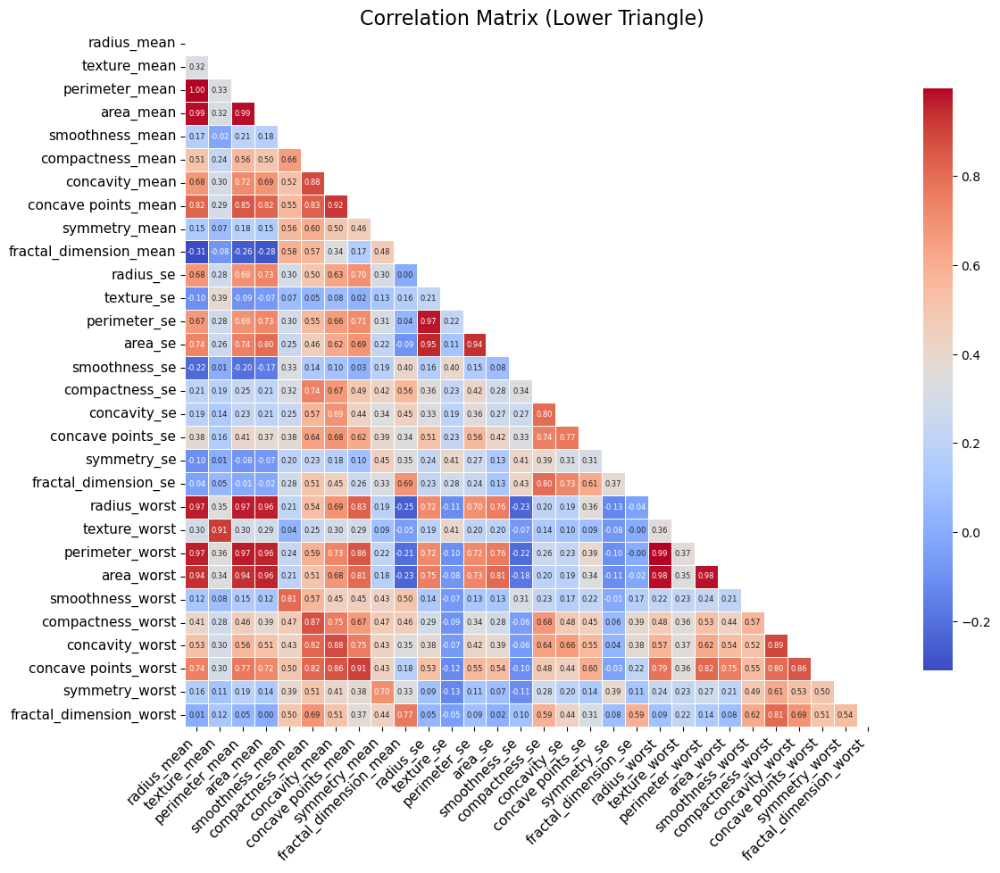

In [32]:
corr_matrix = df.select_dtypes(include='number').corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find index of feature pairs with correlation > 0.8
to_combine = [(col, row) for col in upper.columns for row in upper.index if upper.loc[row, col] > 0.8]

print("Highly correlated feature pairs (|r| > 0.8):")
print(to_combine)

numeric_df = df.select_dtypes(include='number')
corr_matrix = numeric_df.corr()

# Generate a mask for the upper triangle (hide it)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(12, 10))  # bigger figure

sns.heatmap(
    corr_matrix,
    mask=mask,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    square=True,
    linewidths=0.7,         
    linecolor='white',
    cbar_kws={"shrink": 0.8},
    annot_kws={"size": 6} 
)

plt.xticks(rotation=45, ha='right', fontsize=11)  # rotate x labels for readability
plt.yticks(fontsize=11)
plt.title("Correlation Matrix (Lower Triangle)", fontsize=16)
plt.tight_layout()
plt.show()


EDA (Automated Exploratory Data Analysis)
- sweetwiz
- ydata

In [33]:
# TODO

## 2. Data Preperation

**Task**
- Detail how you selected and filtered your data
- Explain any transformations or feature engineering steps (including missing


Variable Cleaning
- Incorrect Values (True instead of 1, 1.000 instead of 1000 → else remove observations)
- Consistency in Data (same format, check time and dates, ..)

In [34]:
# The given data does not include incorrect values and is fully consistent as it only contains float values

Outliers
- Find 1. Point (univariate) outliers or/and 2. Contextual (multivariate) outliers
- Methods to detect outliers: Tukey's Fence and Standardization / 3DS Method
- Methods to detect multivariate outliers: Mahalanobis distance, PCA-based techniques, Robuts Covariance Estimation
- Handle outliers: remove, transform, ignore

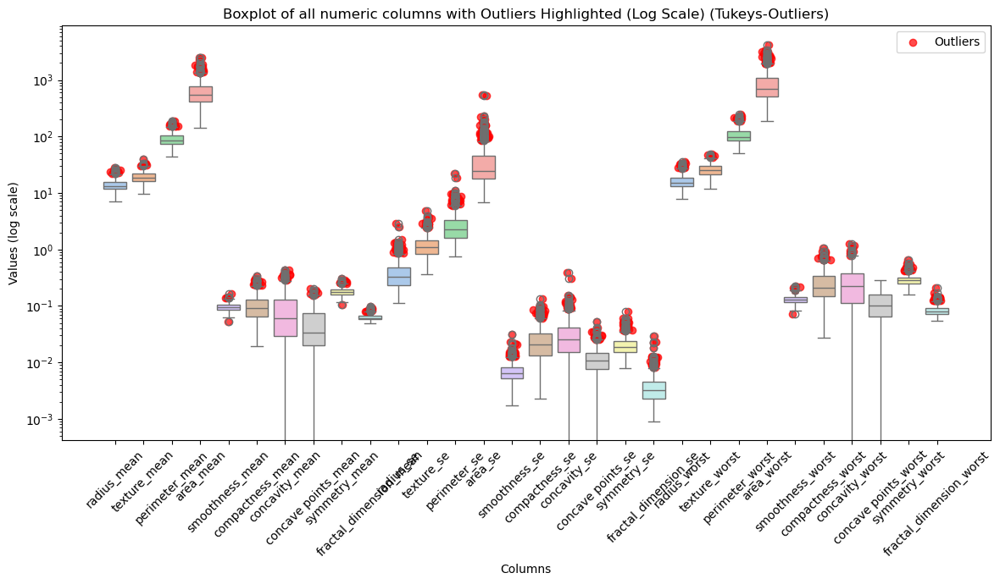

Outliers in column 'radius_mean': [25.22 22.27 24.25 23.27 27.22 23.29 28.11 23.21 23.51 25.73 22.01 27.42
 23.09 24.63]
Outliers in column 'texture_mean': [32.47 33.81 39.28 33.56 31.12 30.72 30.62]
Outliers in column 'perimeter_mean': [171.5 152.8 166.2 152.1 182.1 158.9 188.5 153.5 155.1 174.2 186.9 152.1
 165.5]
Outliers in column 'area_mean': [1404. 1878. 1509. 1761. 1686. 2250. 1685. 2499. 1670. 1364. 1419. 1491.
 1747. 2010. 1546. 1482. 1386. 1335. 1407. 1384. 2501. 1682. 1841. 1347.
 1479.]
Outliers in column 'smoothness_mean': [0.1425  0.1398  0.1447  0.1634  0.1371  0.05263]
Outliers in column 'compactness_mean': [0.2776 0.2839 0.2396 0.2458 0.2293 0.3454 0.2665 0.2768 0.2867 0.2832
 0.2413 0.3114 0.2364 0.2363 0.2576 0.277 ]
Outliers in column 'concavity_mean': [0.3001 0.313  0.3754 0.3339 0.4264 0.3003 0.4268 0.4108 0.2871 0.3523
 0.3201 0.3176 0.2914 0.3368 0.3189 0.3635 0.3174 0.3514]
Outliers in column 'concave points_mean': [0.1604 0.1845 0.1823 0.2012 0.1878 0.162  0.1

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

tukeys_outliers_dict = {}

def tukeys_outliers(series, k=1.5):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_fence = Q1 - k * IQR
    upper_fence = Q3 + k * IQR
    return (series < lower_fence) | (series > upper_fence)

numeric_df = df.select_dtypes(include='number')

plt.figure(figsize=(12, 7))

# Draw boxplot for all columns side by side
sns.boxplot(data=numeric_df, palette='pastel')

# Overlay outliers as red dots
for i, col in enumerate(numeric_df.columns):
    outlier_mask = tukeys_outliers(numeric_df[col])
    outliers = numeric_df.loc[outlier_mask, col]
    tukeys_outliers_dict[col] = outliers.values
    x = np.random.normal(i, 0.08, size=len(outliers))  # jitter for visibility
    plt.scatter(x, outliers, color='red', alpha=0.7, label='Outliers' if i == 0 else "")

plt.yscale('log')  # Apply logarithmic scale to y-axis

plt.title('Boxplot of all numeric columns with Outliers Highlighted (Log Scale) (Tukeys-Outliers)')
plt.xlabel('Columns')
plt.ylabel('Values (log scale)')
plt.xticks(ticks=range(len(numeric_df.columns)), labels=numeric_df.columns, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

for col, vals in tukeys_outliers_dict.items():
    print(f"Outliers in column '{col}': {vals}")


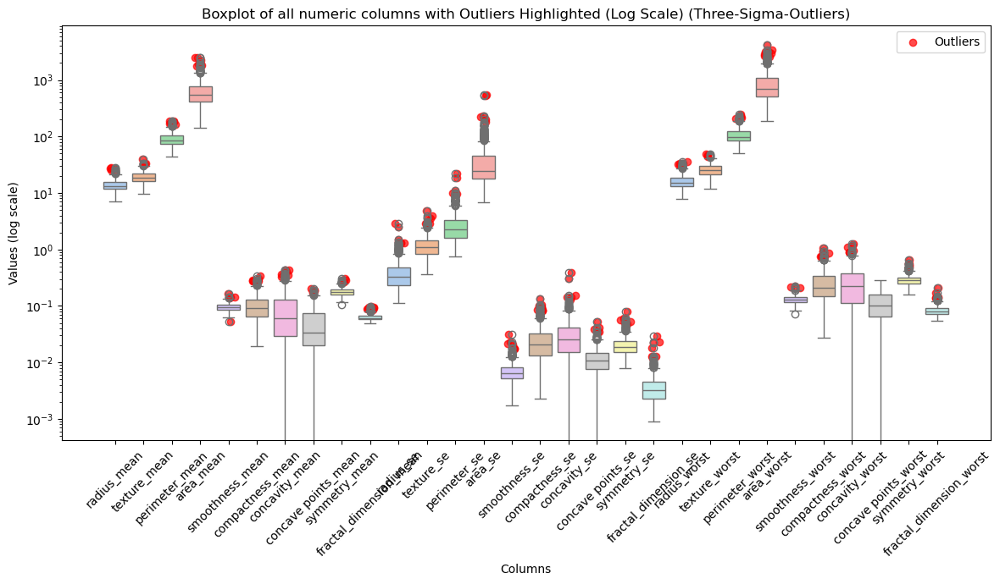

3-sigma outliers in 'radius_mean': [25.22 27.22 28.11 25.73 27.42]
3-sigma outliers in 'texture_mean': [32.47 33.81 39.28 33.56]
3-sigma outliers in 'perimeter_mean': [171.5 166.2 182.1 188.5 174.2 186.9 165.5]
3-sigma outliers in 'area_mean': [1878. 1761. 2250. 2499. 1747. 2010. 2501. 1841.]
3-sigma outliers in 'smoothness_mean': [0.1425  0.1398  0.1447  0.1634  0.05263]
3-sigma outliers in 'compactness_mean': [0.2776 0.2839 0.3454 0.2665 0.2768 0.2867 0.2832 0.3114 0.277 ]
3-sigma outliers in 'concavity_mean': [0.3754 0.3339 0.4264 0.4268 0.4108 0.3523 0.3368 0.3635 0.3514]
3-sigma outliers in 'concave points_mean': [0.1845 0.1823 0.2012 0.1878 0.1913 0.1689]
3-sigma outliers in 'symmetry_mean': [0.304  0.2743 0.2906 0.2655 0.2678]
3-sigma outliers in 'fractal_dimension_mean': [0.09744 0.0898  0.09296 0.08743 0.0845  0.09502 0.09575]
3-sigma outliers in 'radius_se': [1.509 1.296 2.873 1.292 1.37  2.547 1.291]
3-sigma outliers in 'texture_se': [3.568 2.91  3.12  4.885 2.878 3.647 2.92

In [36]:
def three_sigma_outliers(series, sigma=3):
    mean = series.mean()
    std = series.std()
    lower_bound = mean - sigma * std
    upper_bound = mean + sigma * std
    return (series < lower_bound) | (series > upper_bound)

numeric_df = df.select_dtypes(include='number')

outliers_dict_3sigma = {}

plt.figure(figsize=(12, 7))

# Draw boxplot for all columns side by side
sns.boxplot(data=numeric_df, palette='pastel')

# Overlay outliers as red dots
for i, col in enumerate(numeric_df.columns):
    outlier_mask = three_sigma_outliers(numeric_df[col])
    outliers = numeric_df.loc[outlier_mask, col]
    tukeys_outliers_dict[col] = outliers.values
    x = np.random.normal(i, 0.08, size=len(outliers))  # jitter for visibility
    plt.scatter(x, outliers, color='red', alpha=0.7, label='Outliers' if i == 0 else "")

plt.yscale('log')  # Apply logarithmic scale to y-axis

plt.title('Boxplot of all numeric columns with Outliers Highlighted (Log Scale) (Three-Sigma-Outliers)')
plt.xlabel('Columns')
plt.ylabel('Values (log scale)')
plt.xticks(ticks=range(len(numeric_df.columns)), labels=numeric_df.columns, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

for col in numeric_df.columns:
    outlier_mask = three_sigma_outliers(numeric_df[col])
    outliers = numeric_df.loc[outlier_mask, col]
    outliers_dict_3sigma[col] = outliers.values  # or list(outliers)

# Print outliers per column
for col, vals in outliers_dict_3sigma.items():
    print(f"3-sigma outliers in '{col}': {vals}")

In [37]:
# Compare both outliers from tukeys and 3sigma method
outliers_result_dict = {}
for key, value in tukeys_outliers_dict.items():
    compare_val = outliers_dict_3sigma.get(key)
    common = list(set(compare_val) & set(outliers_dict_3sigma.get(key)))
    outliers_result_dict[key] = common


print("Common Outliers in Columns (Tukey's & 3-Sigma methods):\n")
for col, common_vals in outliers_result_dict.items():
    if common_vals:
        print(f"- {col}:")
        for val in common_vals:
            print(f"    • {val}")
    else:
        print(f"- {col}: No common outliers found.")

Common Outliers in Columns (Tukey's & 3-Sigma methods):

- radius_mean:
    • 27.22
    • 25.22
    • 27.42
    • 28.11
    • 25.73
- texture_mean:
    • 32.47
    • 33.81
    • 39.28
    • 33.56
- perimeter_mean:
    • 165.5
    • 166.2
    • 171.5
    • 174.2
    • 182.1
    • 186.9
    • 188.5
- area_mean:
    • 1761.0
    • 2499.0
    • 2501.0
    • 2250.0
    • 1841.0
    • 1747.0
    • 1878.0
    • 2010.0
- smoothness_mean:
    • 0.1425
    • 0.1634
    • 0.1447
    • 0.1398
    • 0.05263
- compactness_mean:
    • 0.2776
    • 0.2839
    • 0.2665
    • 0.2768
    • 0.3454
    • 0.2867
    • 0.2832
    • 0.3114
    • 0.277
- concavity_mean:
    • 0.3754
    • 0.3339
    • 0.4264
    • 0.4108
    • 0.4268
    • 0.3523
    • 0.3368
    • 0.3635
    • 0.3514
- concave points_mean:
    • 0.1845
    • 0.1823
    • 0.1878
    • 0.2012
    • 0.1913
    • 0.1689
- symmetry_mean:
    • 0.304
    • 0.2743
    • 0.2655
    • 0.2678
    • 0.2906
- fractal_dimension_mean:
    • 0.09744
    • 0

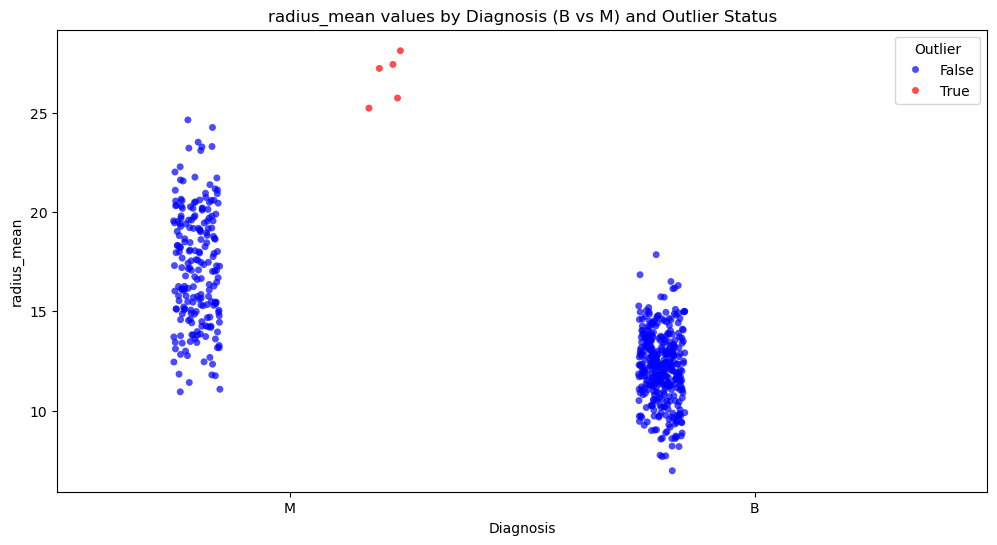

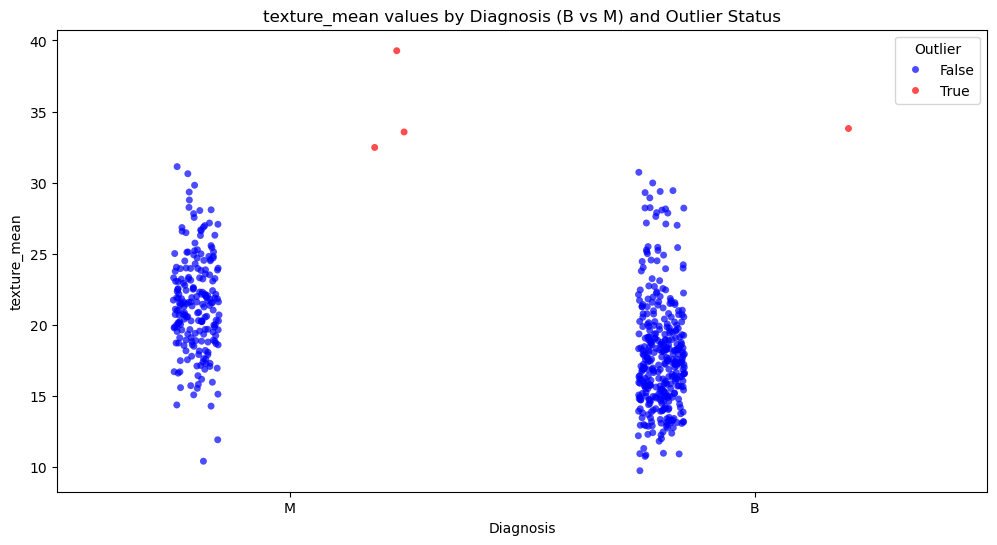

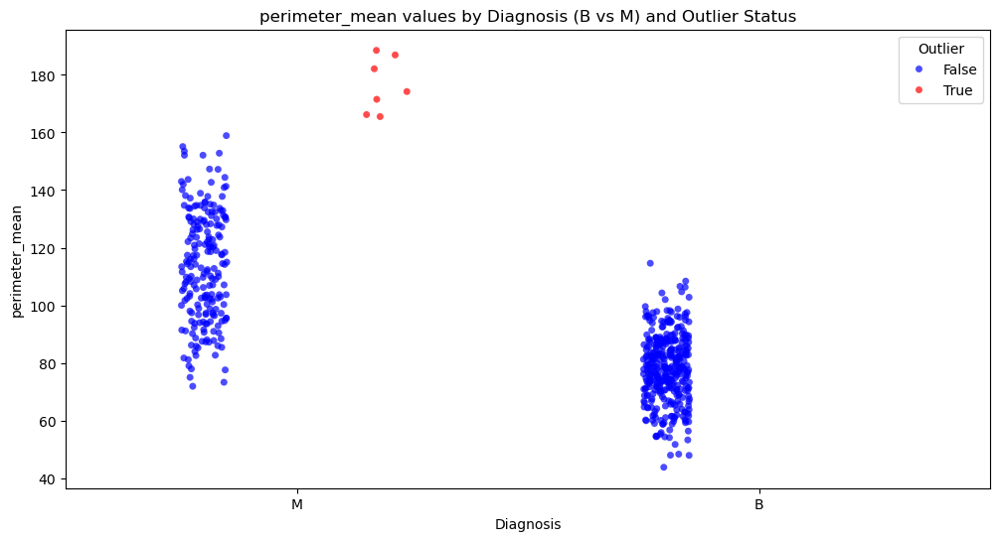

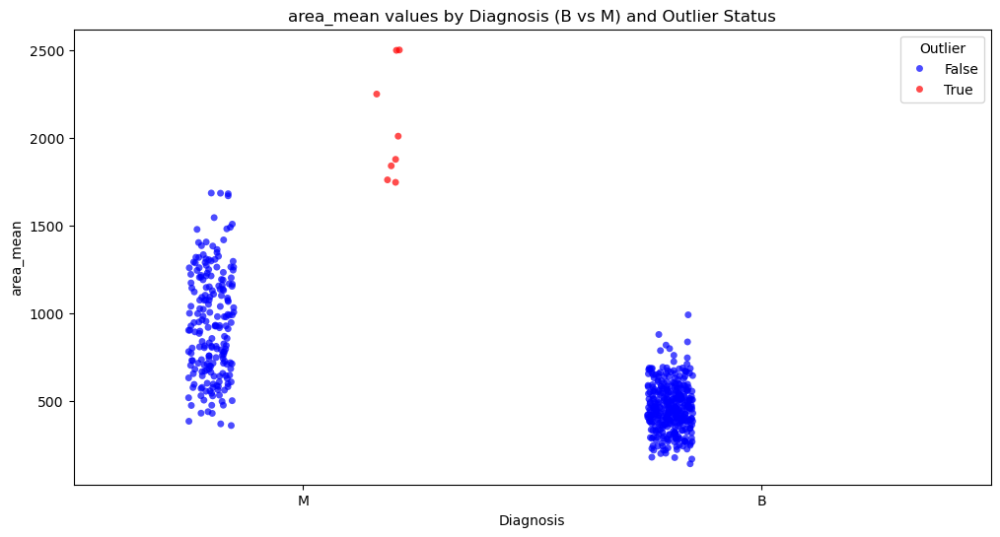

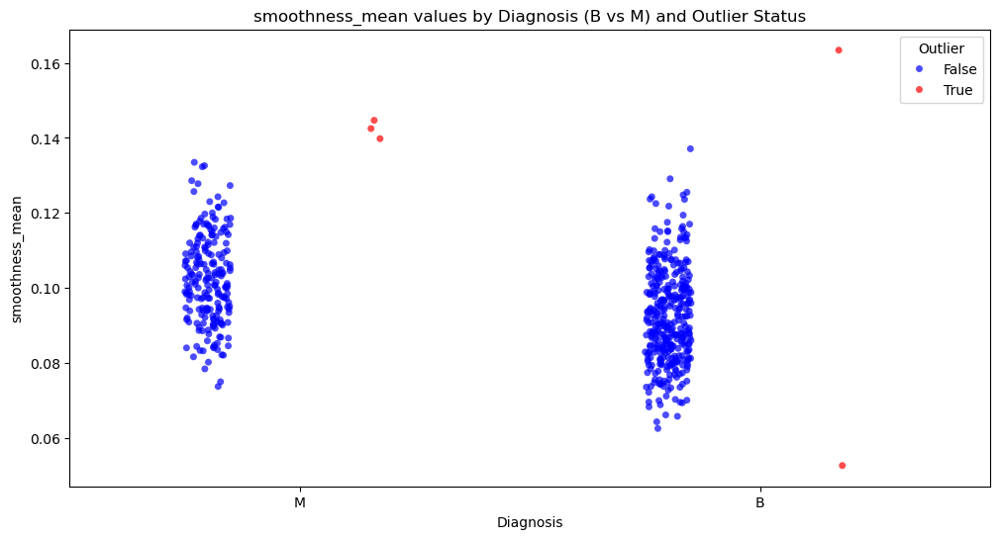

...

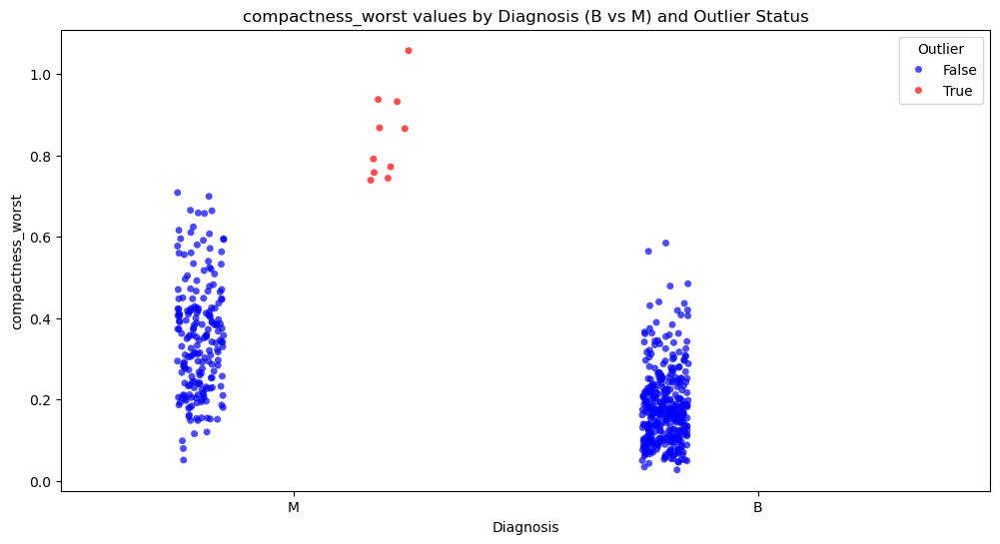

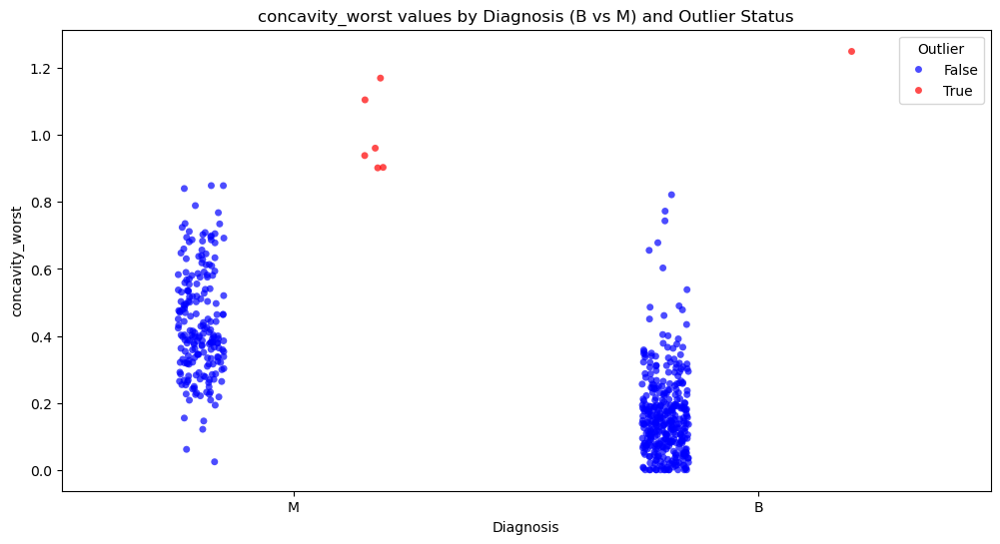

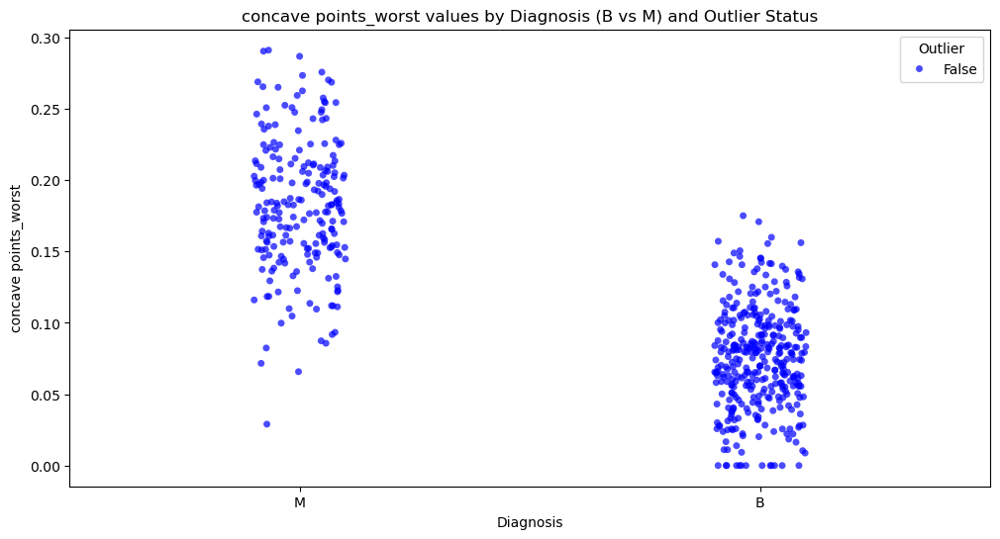

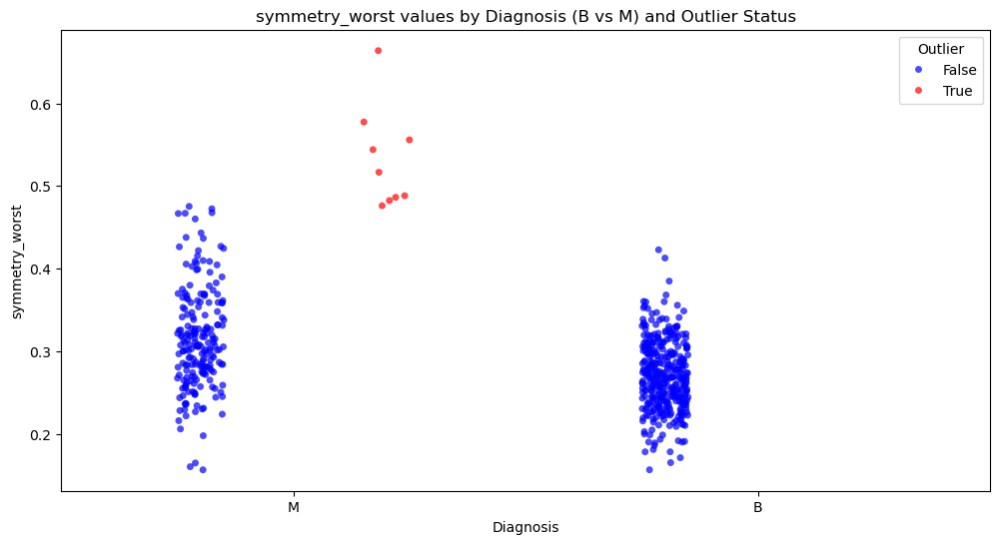

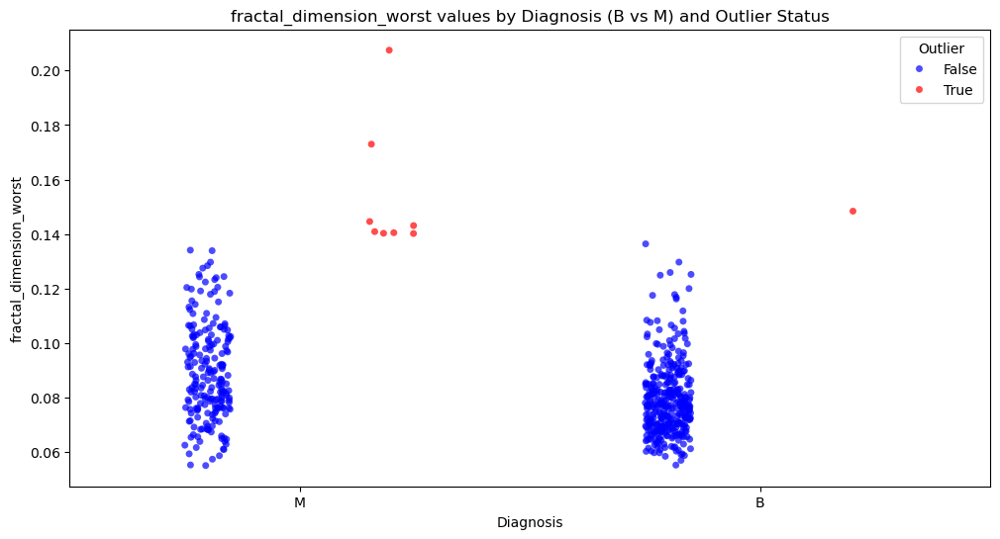

In [38]:
# Handle outliers
for col, outlier_vals in outliers_result_dict.items():
    df[f'{col}_outlier'] = df[col].isin(outlier_vals)

numeric_cols = [col for col in df.select_dtypes(include='number').columns if col in outliers_result_dict]

for col in numeric_cols:
    plt.figure(figsize=(12,6))
    sns.stripplot(
        x='diagnosis',
        y=col,
        hue=f'{col}_outlier',
        data=df,
        jitter=True,
        palette={False: 'blue', True: 'red'},
        dodge=True,  # separates colors side-by-side per category
        alpha=0.7
    )
    plt.title(f'{col} values by Diagnosis (B vs M) and Outlier Status')
    plt.xlabel('Diagnosis')
    plt.ylabel(col)
    plt.legend(title='Outlier')
    plt.show()

The following patterns can be recognized when comparing the outliers:
* if outliers clearly influence a diagnosis, i.e. all outliers are on the M or B side, this means that these outliers have a strong effect on the target variable and should therefore be retained for machine learning in any case
* if outliers cannot be clearly assigned to a diagnosis, they are of little significance and should be deleted purely logically. However, this is not simply possible, as in this case we would have missing values in individual cells and thus rows. An analysis of multivariate outliers is therefore necessary to delete entire rows.

**As a result, we will ignore the identified outliers and later on we will standardize all features**


Missing Data
- Missing completely at random (MCAR)
- Missing at random (MAR)
- Missing not at random (MNAR)

How to deal with missing data:
- Mean/Median Imputation
- Hot-Deck / Distribution
- Model based (eg. regression model)

In [39]:
# Check for any missing data accross the dataframe
print(df.isnull().values.any())

False


Data Wrangling
- Data must be trimmed, reshaped, transformed, aggregated, merged, …
- Data removal of irrelevant variables
- Data transformations:
    - Existing data to new variables (if-else rules, eg. if m → male, elif f → female, else diverse)
    - Binning data: Continuous data to ordinal data (e.g. cluster heights)
    - Distribution transformation: Skewed data can lead to bias → (log-) Transforming the variables
- Reshaping data: more than one data point per unit of observations (wide to long or long to wide)


In [40]:
# Data Wrangling
# for the following we will split our df into a cleaned and a modified variant.

# Remove outlier columns we added earlier:
df = df.drop(columns=df.columns[31:])
df['diagnosis'] = df['diagnosis'].map({'B': 0, 'M': 1})
df_cleaned = df.copy()
df.to_csv("data_cleaned.csv", index=False)

df_modified = df.copy()

Correlation of numeric features with diagnosis:
                         correlation_with_diagnosis
radius_mean                                0.730029
texture_mean                               0.415185
perimeter_mean                             0.742636
area_mean                                  0.708984
smoothness_mean                            0.358560
compactness_mean                           0.596534
concavity_mean                             0.696360
concave points_mean                        0.776614
symmetry_mean                              0.330499
fractal_dimension_mean                    -0.012838
radius_se                                  0.567134
texture_se                                -0.008303
perimeter_se                               0.556141
area_se                                    0.548236
smoothness_se                             -0.067016
compactness_se                             0.292999
concavity_se                               0.253730
concave points_s

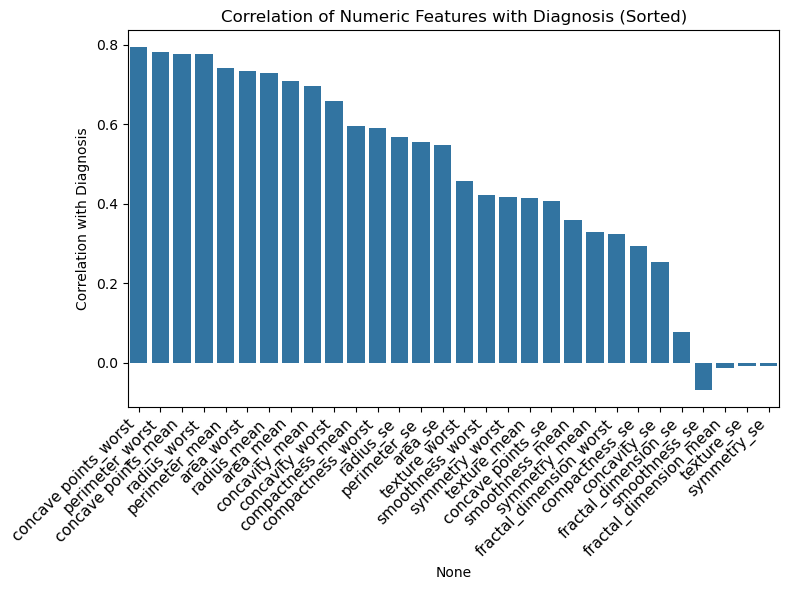

Columns with correlation below 0.05:


In [41]:
numeric_df = df_modified.select_dtypes(include='number').drop(columns=['diagnosis'], errors='ignore')

target_corr = numeric_df.apply(lambda x: x.corr(df_modified['diagnosis']))

target_corr_df = pd.DataFrame(target_corr, columns=['correlation_with_diagnosis'])

print("Correlation of numeric features with diagnosis:")
print(target_corr_df)

target_corr_df = target_corr_df.reindex(target_corr_df['correlation_with_diagnosis'].abs().sort_values(ascending=False).index)

plt.figure(figsize=(8, 6))
sns.barplot(x=target_corr_df.index, y='correlation_with_diagnosis', data=target_corr_df)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.ylabel('Correlation with Diagnosis')
plt.title('Correlation of Numeric Features with Diagnosis (Sorted)')
plt.tight_layout()
plt.show()

# Remove from df_modified by correlation threshold
threshold = 0.05

# Assuming you have your correlation Series/DataFrame (like target_corr_df)
# Filter columns where absolute correlation is below the threshold
low_corr_cols = target_corr_df[ target_corr_df['correlation_with_diagnosis'].abs() < threshold ].index.tolist()

print(f"Columns with correlation below {threshold}:")

df_modified = df_modified.drop(columns=low_corr_cols)

In [57]:
# First we delete redundant features based on our correlation matrix
for col1, col2, in to_combine:
    print(col1, col2)
    if col1 in df_modified.columns and col2 in df_modified.columns:
        df_modified.drop(columns=[col2])
    
df_modified.to_csv("data_modified.csv", index=False)

# Now we want to combine features that we have found a high correlation before
# df_modified.to_csv("data_modified.csv", index=False)

perimeter_mean radius_mean
area_mean radius_mean
area_mean perimeter_mean
concavity_mean compactness_mean
concave points_mean radius_mean
concave points_mean perimeter_mean
concave points_mean area_mean
concave points_mean compactness_mean
concave points_mean concavity_mean
perimeter_se radius_se
area_se area_mean
area_se radius_se
area_se perimeter_se
concavity_se compactness_se
fractal_dimension_se compactness_se
radius_worst radius_mean
radius_worst perimeter_mean
radius_worst area_mean
radius_worst concave points_mean
texture_worst texture_mean
perimeter_worst radius_mean
perimeter_worst perimeter_mean
perimeter_worst area_mean
perimeter_worst concave points_mean
perimeter_worst radius_worst
area_worst radius_mean
area_worst perimeter_mean
area_worst area_mean
area_worst concave points_mean
area_worst area_se
area_worst radius_worst
area_worst perimeter_worst
smoothness_worst smoothness_mean
compactness_worst compactness_mean
concavity_worst compactness_mean
concavity_worst concavi

Dimensionality Reduction
- Goal: remove dimensions -> Curse of dimensionality
- Remove redundancy and noise from the dataset
- Techniques:
    - Combining Features
    - Principal component analyis (PCA)
    - Factor analysis (FA)
    - Singular value decomposition (SVD)
    - Linear discriminant (LDA)

PCA in detail:
- Goal: Combine existing, correlated variables into less, independent variables
- Process:
    - Start with N dimensions in data set
    - Normalize Data
        - Min-Max (uniform distr.)
        - Z-score scaling (gaussian distr.)
        - Log transformation (skewness)
    - Calculate N principal components (PCs) from data set
        - Each PC explains a part of the variance ( → eigenvalue)
        - Each PC receives a contribution to each other ( → eigenvector)
    - Select the PCs with high eigenvalues; ignore the X remaining PCs
- Analyze loadings / eigenvalues of the PCs (Feature Loadings on PCs Heat Map)
- When to use PCAs:
    - Too many variables → Curse of Dimensionality
    - The features in the data are highly correlated → Multicollinearity
    - Visualization of high-dimensional data → Visualize relevant PCs
    - Noise reduction → Getting rid of low-variance components
    - In combination with clustering algorithms


In [43]:
# Dimensionality Reduction (1)
# -- Combining features

In [44]:
# Dimensionality Reduction (2)
# -- PCA
# -- Evaluate PCA

Clustering
- K-Means
    - Evaluation: 
        - Sum of squared Errors (SSE)
        - Silhouette Score
    - Optimal number of clusters:
        - Elbow method

- Optional: Kohonen Self Organizing Maps Algorithm (SOM - run a clustering algorithm (e.g. K-Means) on the weight vectors of SOM)

In [45]:
# Clustering

Sampling
- Partition data in training (70% - 80%) and testing data (20% - 30%)
- Methods
    - k-fold cross validation:
        - partition data in k random samples
        - train model on k-1 of the subsamples
        - evaluate the k-1 models on the remaining testing subsample → error distribution indicates how stable the training is across data samples

    - bootstrapping:
        - From a dataset with N observations you sample N-times with replacement
        - some of the original observations are multiple times in the sampled data - others not at all
        - repeat a large number of times
        - used to sample training data


In [46]:
# Sample Data

## 3. Modeling


**Task**
- Describe two different models selected for analysis
- Describe how each model was implemented

- Taxanomic Overview
- Predictive Modeling vs. Descriptive Modeling

- **Predictive Modeling**
  - Goal: forecast future outcomes
  - Regression:
    - Linear Regression
    - Neural Networks
    - CART
  - Classification:
    - Logistic Regression
    - Nearest Neighbour
    - Boosting Algorithm

- **Descriptive Modeling**
  - Goal: understand data structure & find patterns
  - Segmentation:
    - Hierarchical Clustering
    - K-means
    - DBSCAN
  - Rule/Sequence Mining:
    - Apriori Algorithm
    - FP-growth
    - PrefixSpan

- Machine Learning task
  - Target function: f: Attributes → Class Labels L

- Data Partitioning strategy
  - training using labeled instances (“gold standard”)
  - split data into disjuncts sets of training data and test data

- Learning process
  - classifier learns from training data
  - performance assessment: evaluate classifier on separate test data (to avoid data leakage = classifier learns from training data)

- Problems
  - Limitation of training data
  - Mapping Challenges: Training Set ≠ Entire Population
  - Overfitting

- Local vs. global models
  - Local models
    - k-Nearest Neighbors (k-NN)
    - Focus: Local neighborhood structures
    - Distance based decision boundary
    - Uses nearby data points and distance-based decision boundaries for localized predictions
  - Global models
    - Linear/Logistic Regression; Neural Networks
    - Single, comprehensive decision boundary
    - Utilizes all data to create a unified decision rule for overall generalization

- Trade-Off
  - Interpretability vs Complexity
  - Computational Speed
  - Data Requirements

- Parametric vs. Non-Parametric Models
  - Parametric Models
    - Logistic Regression
    - Finite parameter set
    - Strong distributional assumptions
  - Non-Parametric Models
    - Decision Trees
    - Random Forests
    - Minimal data distribution assumptions

- Model Complexity Spectrum
  - “Easy” models → High interpretability
    - Linear Regression
    - Logistic Regression
    - Decision Trees
  - “Complex” models → Higher predictive accuracy
    - Random Forests
    - Gradient Boosting
    - Deep Neural Networks


In [47]:
# Easy model with high interpretability and lower prediction accuracy
    # - Linear Regression
    # - Logistic Regression
    # - Decision Tree

In [48]:
# Complex model with lower interpretability but higheer prediction accuracy
    # - XGBoost
    # - LightGBM   
    # - Deep Neual Network
    # - Random Forest
    # - Support Vector Machine
    # - Gradient Boosting

## 4. Evaluation

**Task**
- Present evaluation metrics for both models
- Compare model performance and explain results


Evaluation Strategies:
- Confusion Matrix
    - Accuracy: Overall correctness of the model
    - Precision (Positive Predictive Value): How many predicted positives are actually positive
    - Recall (Sensitivity, True Positive Rate): How many actual positives were correctly predicted
    - Specificity (True Negative Rate): How many actual negatives were correctly predicted
    - F1 Score: Harmonic mean of precision and recall (balance between the two)

In [49]:
# Confusion Matrix Easy model

In [50]:
# Confusion Matrix Complex model

- Precision-Recall (PR) Curve
  - The PR curve plots Precision (y-axis) vs. Recall (x-axis) at different thresholds
  - Focuses on performance in imbalanced datasets, where the positive class is rare

- Area Under the PR Curve (AUC-PR)
  - Measures the average trade-off between precision and recall
  - Value range: 0 to 1 → Higher = Better
  - More informative than ROC AUC for imbalanced classes, since it doesn’t account for true negatives

In [51]:
# PR & AUC-PR easy model

In [52]:
# PR & AUC-PR complex model

- ROC Curve (Receiver Operating Characteristic)
  - Plots True Positive Rate (Recall) vs. False Positive Rate (FPR)
  - Shows model performance across all classification thresholds
  - Each point on the curve corresponds to a different threshold

- Area Under the ROC Curve (AUC-ROC)
  - AUC = Area under the ROC Curve (value between 0 and 1)
  - Measures the model’s ability to distinguish between classes
  - Interpretation:
    - 1.0 = perfect classifier
    - 0.5 = random guessing
    - < 0.5 = worse than random

In [53]:
# ROC & AUC ROC easy model

In [54]:
# ROC & AUC ROC complex model